In [2]:
using ReachabilityAnalysis, SparseArrays, Plots

In [46]:
const β = 0.5;  # tasa de contagio
const μ = 0.05; # infectados no documentados
const α = 0.2;  # fracción de infectados documentados

const σ₀ = 0.5; # dias-1; σ₀ =1/Z; Z=tiempo de latencia
const ασ₀ = α * σ₀
const γ = 0.185;# dias-1; γ =1/D; D=tiempo medio de infecciosidad

0.185

## SEIR - Nonlinear

In [47]:
# s: susceptibles
# e: expuestos
# i_d: infectados documentados
# i_nd: infectados no documentados
# r: removidos o recuperados

@taylorize function SEIR!(du, u, p, t)
    
    s, e, i_d, i_nd, r = u # unpack

    # auxiliary variables
    βi_d = β*i_d
    βi_nd = β*i_nd
    μβi_nd  = μ*βi_nd
    aux1 = s*(βi_d + μβi_nd)
    
    σ₀e = σ₀*e
    aux2 = α * σ₀e
    γi_d = γ*i_d
    γi_nd = γ*i_nd

    # s' = -s*(β*i_d + μ*β*i_nd)
    du[1] = -aux1
    
    # e' = s*(β*i_d + μ*β*i_nd) - (1/Z)*e
    du[2] = aux1 - σ₀e
    
    # i_d' = (1/Z)*α*e - (1/D)*i_d
    du[3] = aux2 - γi_d
    
    # i_nd' = (1/Z)*(1-α)*e - (1/D)*i_nd
    du[4] = σ₀e - aux2 - γi_nd
    
    # r' = (1/D)*(i_d + i_nd)
    du[5] = γi_d + γi_nd
 
    return du
end

In [48]:
X0 = Hyperrectangle([99., 1., 10., 1., 0.],
                    5 .* [1., 1., 1., 1., 0.]);

In [49]:
prob = @ivp(x' = SEIR!(x), dim=5, x(0) ∈ X0);

In [51]:
@time sol = solve(prob, tspan=(0.0, 100.), TMJets(abs_tol=1e-10, orderT=7, orderQ=1));
solz = overapproximate(sol, Zonotope);

  3.528815 seconds (41.26 M allocations: 2.817 GiB, 14.76% gc time)


In [ ]:
#   4.473590 seconds (48.11 M allocations: 3.472 GiB, 18.73% gc time)

#   3.518285 seconds (44.45 M allocations: 3.127 GiB, 18.90% gc time)

#   3.528815 seconds (41.26 M allocations: 2.817 GiB, 14.76% gc time)

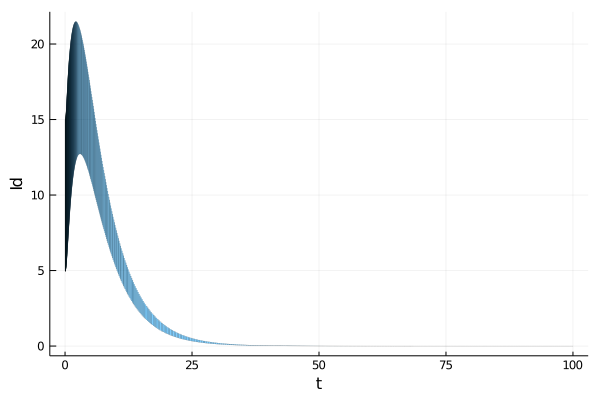

In [32]:
plot(solz, vars=(0, 3), xlab="t", ylab="Id", lw=0.2)

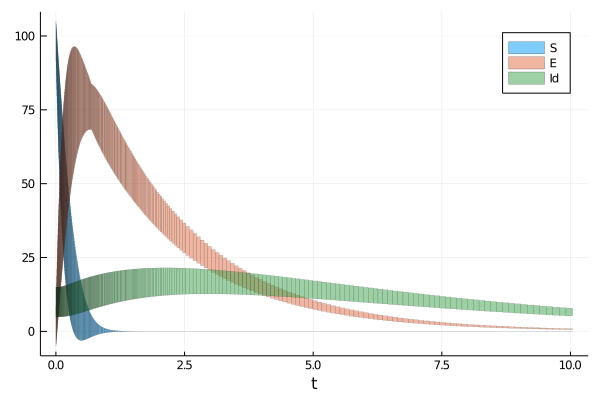

In [33]:
plot(solz(0..10), vars=(0, 1), xlab="t", lab="S", lw=0.2)
plot!(solz(0..10), vars=(0, 2), xlab="t", lab="E", lw=0.2)
plot!(solz(0..10), vars=(0, 3), xlab="t", lab="Id", lw=0.2)

## SEIR - Nonlinear with interval value of $\beta$

In [52]:
# idea: cambio a β escalar como siendo la variable βi con dinamica βi' = 0
@taylorize function SEIR_βi!(du, u, p, t)
    
    s, e, i_d, i_nd, r, βi = u # unpack

    # auxiliary variables
    βi_d = βi*i_d
    βi_nd = βi*i_nd
    μβi_nd  = μ*βi_nd
    aux1 = s*(βi_d + μβi_nd)
    
    σ₀e = σ₀*e
    aux2 = α * σ₀e
    γi_d = γ*i_d
    γi_nd = γ*i_nd

    # s' = -s*(β*i_d + μ*β*i_nd)
    du[1] = -aux1
    
    # e' = s*(β*i_d + μ*β*i_nd) - (1/Z)*e
    du[2] = aux1 - σ₀e
    
    # i_d' = (1/Z)*α*e - (1/D)*i_d
    du[3] = aux2 - γi_d
    
    # i_nd' = (1/Z)*(1-α)*e - (1/D)*i_nd
    du[4] = σ₀e - aux2 - γi_nd
    
    # r' = (1/D)*(i_d + i_nd)
    du[5] = γi_d + γi_nd
 
    # βi' = 0
    du[6] = zero(βi)
    
    return du
end

In [58]:
X0_βi = Hyperrectangle([99., 1., 10., 1., 0., β], 5 .* [1., 1., 1., 1., 0., β*0.01]);
prob = @ivp(x' = SEIR_βi!(x), dim=6, x(0) ∈ X0_βi);

@time sol = solve(prob, tspan=(0.0, 100.), TMJets(abs_tol=1e-10, orderT=7, orderQ=1, max_steps=10_000));
solz = overapproximate(sol, Zonotope);

 41.493936 seconds (354.06 M allocations: 24.540 GiB, 16.38% gc time)


In [61]:
5 * β * 0.01

0.025

In [59]:
numrsets(sol)

6460

In [60]:
plot(solz(0..10), vars=(0, 1), xlab="t", lab="S", lw=0.2)
plot!(solz(0..10), vars=(0, 2), xlab="t", lab="E", lw=0.2)
plot!(solz(0..10), vars=(0, 3), xlab="t", lab="Id", lw=0.2)

## SEIR Linealizado

In [115]:
function SEIR_Linear()
    #x = [e, i_d, i_nd]
    A = [     -σ₀   β   μ*β
             σ₀*α  -γ     0.
          σ₀*(1-α)  0.   -γ]
    X0 = Hyperrectangle([99., 0.1, 0.],
                        [1., 0.1, 0.]);
    prob = @ivp(x' = A*x, x(0) ∈ X0, x ∈ Universe(3))
end

SEIR_Linear (generic function with 1 method)

In [116]:
prob = SEIR_Linear();
sol = solve(prob, T=100., alg=BOX(δ=1e-2));

In [66]:
plot(sol, vars=(0, 2),
     linecolor=:blue, color=:blue, alpha=0.8, lw=0.1,
     xlab="t", ylab="i_nd")

In [71]:
using LinearAlgebra

In [72]:
eigvals(prob.s.A)

3-element Array{Float64,1}:
 -0.6337151266675548
 -0.185
 -0.05128487333244516

In [117]:
plot(sol(0..20), vars=(0, 1), xlab="t", lab="S", lw=0.2)
plot!(sol(0..20), vars=(0, 2), xlab="t", lab="E", lw=0.2)
plot!(sol(0..20), vars=(0, 3), xlab="t", lab="Id", lw=0.2)

### SEIR Linealizado con parametro $\beta$

In [75]:
prob.s.A

3×3 Array{Float64,2}:
 -0.5   0.5     0.025
  0.1  -0.185   0.0
  0.4   0.0    -0.185

In [89]:
one_int = interval(1.0)
βi

UndefVarError: UndefVarError: βi not defined

In [120]:
function SEIR_Linear_βi(; βi=interval(β-0.05, β+0.05))
    # x = [e, i_d, i_nd]
    
    A = [     -σ₀   βi   μ*βi
             σ₀*α  -γ     0
          σ₀*(1-α)  0   -γ] |> IntervalMatrix

    X0 = Hyperrectangle([99., 0.1, 0.],
                        [1., 0.1, 0.]);
    
    prob = @ivp(x' = A*x, x(0) ∈ X0, x ∈ Universe(3))
end

SEIR_Linear_βi (generic function with 1 method)

In [121]:
SEIR_Linear_βi()

InitialValueProblem{ConstrainedLinearContinuousSystem{IntervalArithmetic.Interval{Float64},IntervalMatrix{Float64,IntervalArithmetic.Interval{Float64},Array{IntervalArithmetic.Interval{Float64},2}},Universe{Float64}},Hyperrectangle{Float64,Array{Float64,1},Array{Float64,1}}}(ConstrainedLinearContinuousSystem{IntervalArithmetic.Interval{Float64},IntervalMatrix{Float64,IntervalArithmetic.Interval{Float64},Array{IntervalArithmetic.Interval{Float64},2}},Universe{Float64}}(IntervalArithmetic.Interval{Float64}[[-0.5, -0.5] [0.45, 0.550001] [0.0224999, 0.0275001]; [0.1, 0.100001] [-0.185, -0.184999] [0, 0]; [0.4, 0.400001] [0, 0] [-0.185, -0.184999]], Universe{Float64}(3)), Hyperrectangle{Float64,Array{Float64,1},Array{Float64,1}}([99.0, 0.1, 0.0], [1.0, 0.1, 0.0]))

In [122]:
prob = SEIR_Linear_βi();
solint = solve(prob, T=10., alg=ASB07(δ=1e-2));

In [123]:
plot!(solint(0..4), vars=(0, 1), xlab="t", lab="S", lw=0.2)
plot!(solint(0..4), vars=(0, 2), xlab="t", lab="E", lw=0.2)
plot!(solint(0..4), vars=(0, 3), xlab="t", lab="Id", lw=0.2)